In [26]:
# Merge nas 5 tabelas distintas para trabalharmos com uma Dataframe única

import pandas as pd
from pyxlsb import open_workbook as open_xlsb

MD1 = pd.read_excel('DadosOTs_Transformados - Copia PoliJr.xlsb', sheet_name='MasterData1')

MD2 = pd.read_excel('DadosOTs_Transformados - Copia PoliJr.xlsb', sheet_name='MasterData2')
MD2.rename(columns={'TurbineFunctionalLocation': 'Aerogenerador'}, inplace=True)

OTs = pd.read_excel('DadosOTs_Transformados - Copia PoliJr.xlsb', sheet_name='Consumo_OTs')
OTs.rename(columns={'Aerogenerador (Ubicación Técnica)': 'Aerogenerador'}, inplace=True)

MDT1 = pd.read_excel('DadosOTs_Transformados - Copia PoliJr.xlsb', sheet_name='MasterData_Materiais1')
MDT1.rename(columns={'Number': 'Material'}, inplace=True)

MDT2 = pd.read_excel('DadosOTs_Transformados - Copia PoliJr.xlsb', sheet_name='MasterData_Materiais2')

df = MD1.merge(MD2, on='Aerogenerador', how='inner')
df = df.merge(OTs, on='Aerogenerador', how='inner')
df = df.merge(MDT1, on='Material', how='inner')
df = df.merge(MDT2, on='Material', how='inner')
df

df.to_excel('Merge_Dados.xlsx') 

In [3]:
import pandas as pd

def process_table(df):
    result_rows = []
    zero_965_nonzero_966 = []
    
    # Itera por cada ORDEN única
    for order in df['Orden'].unique():
        df_order = df[df['Orden'] == order]
        
        # Itera por cada MATERIAL único dentro da ORDEN
        for material in df_order['Material'].unique():
            df_material = df_order[df_order['Material'] == material]
            
            # Soma as quantidades para as classes de movimento 965 e 966
            qty_965 = df_material[df_material['Clase de movimiento'] == 965]['Cantidad'].sum()
            qty_966 = df_material[df_material['Clase de movimiento'] == 966]['Cantidad'].sum()
            
            # Calcula o saldo
            saldo = qty_965 - qty_966
            
            # Cria uma nova linha com os dados agregados
            new_row = {
                'Orden': order,
                'Material': material,
                'Clase de movimiento': 965,
                'Saldo': saldo
            }
            
            result_rows.append(new_row)
            
            # Verifica se qty_965 é zero e qty_966 é diferente de zero
            if qty_965 == 0 and qty_966 != 0:
                zero_965_nonzero_966.append({
                    'Orden': order,
                    'Material': material,
                    'Clase de movimiento': 966,
                    'Cantidad 966': qty_966
                })
    
    # Cria um novo DataFrame com as linhas resultantes
    df_result = pd.DataFrame(result_rows)
    df_zero_965_nonzero_966 = pd.DataFrame(zero_965_nonzero_966)
    
    return df_result, df_zero_965_nonzero_966

# Carregar o dataframe original
df = pd.read_excel('DadosOTs_Transformados - Copia PoliJr.xlsb', sheet_name='Consumo_OTs')

# Processar o dataframe
df_processed, df_zero_965_nonzero_966 = process_table(df)

# Salvar o dataframe processado em um novo arquivo
df_processed.to_excel('Balanco_Compras.xlsx', index=False)

# Salvar o dataframe com qty_965 zero e qty_966 diferente de zero em um novo arquivo
df_zero_965_nonzero_966.to_excel('Linhas_Zero_965_Nonzero_966.xlsx', index=False)

# Imprimir o dataframe e o número de linhas
print(df_zero_965_nonzero_966)
print(f"Number of rows: {df_zero_965_nonzero_966.shape[0]}")


          Orden  Material  Clase de movimiento  Cantidad 966
0     402606584  GP082781                  966           1.0
1     402612935  GP011546                  966           1.0
2     402618103     50846                  966           1.0
3     402624587  GP266727                  966           1.0
4     402624587  GP105540                  966           1.0
...         ...       ...                  ...           ...
4960  405156145   AMB0155                  966           1.0
4961  405161328  GP010564                  966           1.0
4962  405161481  GP004265                  966           1.0
4963  405163832  GP004891                  966           1.0
4964  405167591  GP234915                  966           1.0

[4965 rows x 4 columns]
Number of rows: 4965


In [4]:
print(df_processed[df_processed['Saldo'] < 0])

            Orden  Material  Clase de movimiento  Saldo
44      402606584  GP082781                  965   -1.0
121     402612935  GP011546                  965   -1.0
173     402618103     50846                  965   -1.0
236     402624050  GP011692                  965   -1.0
246     402624587  GP266727                  965   -1.0
...           ...       ...                  ...    ...
155802  405156145   AMB0155                  965   -1.0
155934  405161328  GP010564                  965   -1.0
155958  405161481  GP004265                  965   -1.0
156074  405163832  GP004891                  965   -1.0
156114  405167591  GP234915                  965   -1.0

[6106 rows x 4 columns]


In [4]:
import pandas as pd
from concurrent.futures import ThreadPoolExecutor

def process_material(order_df, material, order, total_orders):
    df_material = order_df[order_df['Material'] == material]
    
    qty_965 = df_material[df_material['Clase de movimiento'] == 965]['Cantidad'].sum()
    qty_966 = df_material[df_material['Clase de movimiento'] == 966]['Cantidad'].sum()
    
    if qty_965 == 0 and qty_966 != 0:
        print(f"Excluindo material {material} da ordem {order} por falta de 965.")
        return pd.DataFrame()  # Retorna um DataFrame vazio para indicar a exclusão
    else:
        saldo = qty_965 - qty_966
        print(f"Processando material {material} da ordem {order}. Saldo: {saldo}")
        
        # Atualizar a primeira ocorrência do material
        updated_row = df_material.iloc[0].copy()
        updated_row['Cantidad'] = saldo
        updated_row['Clase de movimiento'] = 965
        
        return updated_row.to_frame().T  # Retorna como DataFrame de uma linha

def process_order(df, order, total_orders, processed_orders):
    order_df = df[df['Orden'] == order]
    materials = order_df['Material'].unique()
    
    processed_materials = []
    
    for material in materials:
        processed_materials.append(process_material(order_df, material, order, total_orders))
    
    print(f"Ordem {order} processada ({processed_orders + 1} de {total_orders}).")
    return pd.concat(processed_materials, ignore_index=True)

def process_table(df):
    unique_orders = df['Orden'].unique()
    total_orders = len(unique_orders)
    
    processed_orders = 0
    
    # Usar ThreadPoolExecutor para processamento paralelo
    with ThreadPoolExecutor() as executor:
        results = []
        for order in unique_orders:
            results.append(executor.submit(process_order, df, order, total_orders, processed_orders))
            processed_orders += 1
            print(f"Enviando ordem {processed_orders} para processamento.")
    
    # Concatenar todos os DataFrames processados
    df_processed = pd.concat([res.result() for res in results], ignore_index=True)
    
    return df_processed

# Carregar o dataframe original
df = pd.read_excel('df_merge.xlsx')

# Processar o dataframe
df_processed = process_table(df)

# Salvar o dataframe processado no mesmo arquivo original
df_processed.to_csv('df_merge_sem966.csv', index=False)

# Imprimir o dataframe processado e o número de linhas
print(df_processed)
print(f"Number of rows: {df_processed.shape[0]}")


Enviando ordem 1 para processamento.
Processando material GP305361 da ordem 402975101. Saldo: 1.0
Ordem 402975101 processada (1 de 73076).
Processando material GP090868 da ordem 403186023. Saldo: 1.0
Processando material GP040684 da ordem 403186023. Saldo: 2.0
Ordem 403186023 processada (2 de 73076).
Enviando ordem 2 para processamento.
Enviando ordem 3 para processamento.
Enviando ordem 4 para processamento.
Enviando ordem 5 para processamento.
Processando material GP040684 da ordem 403361491. Saldo: 1.0
Ordem 403361491 processada (3 de 73076).
Processando material GP007395-004 da ordem 403504372. Saldo: 200.0
Ordem 403504372 processada (5 de 73076).
Enviando ordem 6 para processamento.
Enviando ordem 7 para processamento.
Enviando ordem 8 para processamento.
Processando material GP040684 da ordem 403423627. Saldo: -3.0
Ordem 403423627 processada (4 de 73076).
Enviando ordem 9 para processamento.
Enviando ordem 10 para processamento.
Processando material GP043333 da ordem 404458869. S

In [40]:
import pandas as pd
from datetime import datetime

# Lê o arquivo CSV
df = pd.read_csv('df_merge_sem966.csv')

# Converte a coluna 'TurbineStartUpDate' para o tipo datetime
df['TurbineStartUpDate'] = pd.to_datetime(df['TurbineStartUpDate'])

# Define a data de referência
reference_date = datetime(2024, 7, 1)

# Calcula a idade das turbinas em anos, com precisão de duas casas decimais
df['TurbineAge'] = ((reference_date - df['TurbineStartUpDate']).dt.days / 365.25).round(2)

# Substitui valores negativos na coluna 'Cantidad' por 0
df['Cantidad'] = df['Cantidad'].clip(lower=0)

# Salva o DataFrame com as novas colunas no arquivo CSV original
df.to_csv('df_merge_sem966.csv', index=False)

# Exibe as primeiras linhas para verificar
print(df[['TurbineStartUpDate', 'TurbineAge', 'Cantidad']].head())


C:\Users\natal\AppData\Local\Temp\ipykernel_26280\1252579260.py:5: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('df_merge_sem966.csv')


  TurbineStartUpDate  TurbineAge  Cantidad
0                NaT         NaN       1.0
1                NaT         NaN       1.0
2                NaT         NaN       2.0
3                NaT         NaN       1.0
4                NaT         NaN       0.0


In [72]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Carregar o arquivo csv
df = pd.read_csv('df_merge_sem966.csv')

# Verificar quais moedas estão presentes
moeda = df['Moneda...23'].unique()
print("Moedas presentes no DataFrame:")
print(moeda)

# Taxas de câmbio para conversão de preço para BRL
taxas_cambio = {
    'ARS': 0.0085,   # Peso Argentino
    'CLP': 0.0057,   # Peso Chileno
    'DOP': 0.05,     # Peso Dominicano
    'GTQ': 0.070,    # Quetzal Guatemalteco
    'HNL': 0.130,    # Lempira Hondurenha
    'MXN': 0.25,     # Peso Mexicano
    'PEN': 0.08,     # Sol Peruano
    'UYU': 0.038,    # Peso Uruguaio
    'BRL': 1.0       # Real Brasileiro
}

# Função para converter preços para BRL e atualizar a moeda para o formato 'nomeantigo-BRL'
def converter_preco_para_brl(row):
    if row['Moneda...23'] in taxas_cambio:
        taxa = taxas_cambio[row['Moneda...23']]
        row['Importe ML...11'] *= taxa
        row['Moneda...23'] = f"{row['Moneda...23']}-BRL"  # Substituir a moeda para 'nomeantigo-BRL'
    return row

# Aplicar a conversão de preço e substituição de moeda para cada linha do DataFrame
df = df.apply(converter_preco_para_brl, axis=1)

# Salvar o DataFrame atualizado em um novo arquivo
df.to_csv('df_merge_sem966_BRL.csv', index=False)


C:\Users\natal\AppData\Local\Temp\ipykernel_26280\1554135448.py:6: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('df_merge_sem966.csv')


Moedas presentes no DataFrame:
['BRL' 'ARS' 'CLP' 'DOP' 'GTQ' 'HNL' 'MXN' 'PEN' 'UYU']


In [117]:
import pandas as pd

# Carregar o arquivo csv
df = pd.read_csv('df_merge_sem966_BRL.csv')

# Filtrar apenas as linhas com 'TurbinePlatform' igual a 'G9X'
filtered_df = df[df['TurbinePlatform'] == 'G9X']

# Obter a quantidade de aerogeradores únicos na plataforma G9X
num_aerogeneradores = filtered_df['Aerogenerador'].nunique()

# Criar uma lista para armazenar os resultados
result_list = []

# Iterar por cada aerogenerador único
for aerogenerador in filtered_df['Aerogenerador'].unique():
    # Filtrar as linhas para o aerogenerador atual
    aerogenerador_df = filtered_df[filtered_df['Aerogenerador'] == aerogenerador]
    
    # Calcular o MBTF para o aerogenerador
    datas_aerogenerador = pd.to_datetime(aerogenerador_df['Fecha de documento'])
    if len(datas_aerogenerador) > 1:
        datas_sorted_aerogenerador = datas_aerogenerador.sort_values()
        intervalos_aerogenerador = datas_sorted_aerogenerador.diff().dropna()
        mtbf_aerogenerador = intervalos_aerogenerador.mean()
    else:
        mtbf_aerogenerador = pd.Timedelta(0)

    # Inicializar o preço total gasto para o aerogenerador
    preco_aerogenerador = 0

    # Iterar por cada material único
    for material in aerogenerador_df['Material'].unique():
        # Filtrar as linhas para o material atual
        material_df = aerogenerador_df[aerogenerador_df['Material'] == material]
        
        # Calcular a quantidade média ignorando valores negativos de Cantidad
        quantidade_aerogenerador_material = material_df[material_df['Cantidad'] > 0]['Cantidad'].sum()
        
        # Calcular o preço médio ignorando valores negativos de Importe ML...11
        preco_aerogenerador_material = material_df[material_df['Importe ML...11'] > 0]['Importe ML...11'].sum()
        
        # Adicionar ao preço total gasto para o aerogenerador
        preco_aerogenerador += preco_aerogenerador_material
        
        # Obter a unidade de medida
        unidade_medida = material_df['Unidad medida base'].iloc[0] if not material_df['Unidad medida base'].empty else 'Desconhecida'
        
        # Obter a moeda
        moeda = material_df['Moneda...23'].iloc[0] if not material_df['Moneda...23'].empty else 'Desconhecida'
        
        # Obter o grupo de trabalho (DescGrupo)
        desc_grupo = material_df['DescGrupo'].iloc[0] if not material_df['DescGrupo'].empty else 'Desconhecido'
        
        # Obter a idade da turbina
        idade_turbina = aerogenerador_df['TurbineAge'].mean()
        
        # Recolher todas as datas para o material
        datas_material = pd.to_datetime(material_df['Fecha de documento'])
        
        # Calcular o MBTF para o aerogenerador e material
        if len(datas_material) > 1:
            datas_sorted_material = datas_material.sort_values()
            intervalos_material = datas_sorted_material.diff().dropna()
            mtbf_aerogenerador_material = intervalos_material.mean()
        else:
            mtbf_aerogenerador_material = pd.Timedelta(0)
        
        # Calcular o MBTF para o material em todos os aerogeradores
        material_global_df = filtered_df[filtered_df['Material'] == material]
        datas_material_global = pd.to_datetime(material_global_df['Fecha de documento'])
        if len(datas_material_global) > 1:
            datas_sorted_material_global = datas_material_global.sort_values()
            intervalos_material_global = datas_sorted_material_global.diff().dropna()
            mtbf_material = intervalos_material_global.mean()
        else:
            mtbf_material = pd.Timedelta(0)
        
        # Adicionar os resultados à lista
        result_list.append({
            'aerogenerador': aerogenerador,
            'material': material,
            'quantidade_aerogenerador_material': quantidade_aerogenerador_material,
            'unidade_medida': unidade_medida,
            'preco_aerogenerador_material': preco_aerogenerador_material,
            'moeda': moeda,
            'desc_grupo': desc_grupo,
            'idade_turbina': idade_turbina,
            'mtbf_aerogenerador_material': mtbf_aerogenerador_material,
            'mtbf_aerogenerador': mtbf_aerogenerador,
            'mtbf_material': mtbf_material
        })

# Criar um DataFrame a partir da lista de resultados
result_df = pd.DataFrame(result_list)

# Calcular quantidade_media_material e preco_medio_material
result_df['quantidade_media_material'] = result_df.groupby('material')['quantidade_aerogenerador_material'].transform('mean') / num_aerogeneradores
result_df['preco_medio_material'] = result_df.groupby('material')['preco_aerogenerador_material'].transform('mean') / num_aerogeneradores

# Calcular preco_aerogenerador (preço total gasto por aerogenerador independentemente do material)
result_df['preco_aerogenerador'] = result_df.groupby('aerogenerador')['preco_aerogenerador_material'].transform('sum')

# Salvar o DataFrame resultante em um novo arquivo CSV
result_df.to_csv('aerogeneradores_g9x_dados_completos.csv', index=False)

print("DataFrame resultante criado e salvo como 'aerogeneradores_g9x_dados_completos.csv'.")


C:\Users\natal\AppData\Local\Temp\ipykernel_26280\3273101180.py:4: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('df_merge_sem966_BRL.csv')


DataFrame resultante criado e salvo como 'aerogeneradores_g9x_dados_completos.csv'.


C:\Users\natal\AppData\Local\Temp\ipykernel_26280\2191712329.py:4: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('df_merge_sem966_BRL.csv')


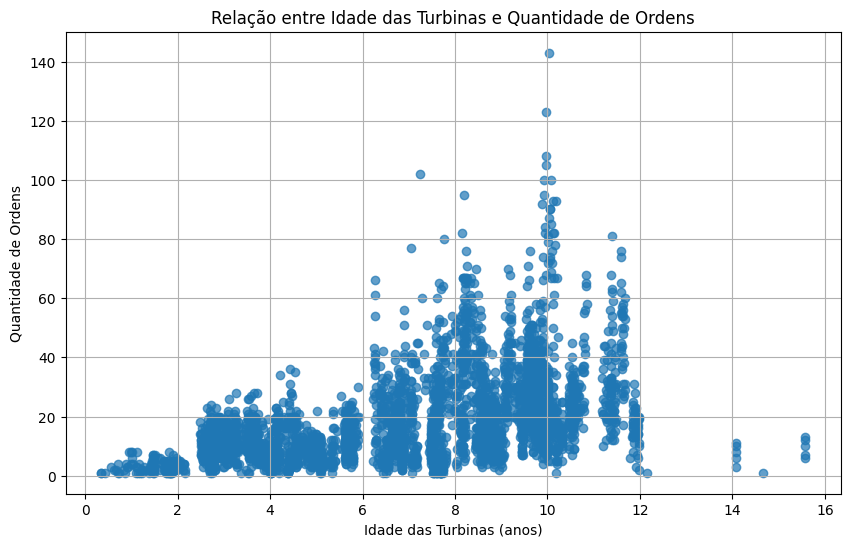

In [118]:
import matplotlib.pyplot as plt

# Carregar o arquivo csv
df = pd.read_csv('df_merge_sem966_BRL.csv')

# Agrupa os dados por 'Aerogenerador' e conta o número de valores únicos em 'Orden'
ordem_counts = df.groupby('Aerogenerador')['Orden'].nunique()

# Cria um DataFrame com a idade das turbinas e a quantidade de ordens
turbine_age_orden_count = df[['Aerogenerador', 'TurbineAge']].drop_duplicates()
turbine_age_orden_count['QuantidadeOrdens'] = turbine_age_orden_count['Aerogenerador'].map(ordem_counts)

# Plota um gráfico relacionando 'TurbineAge' com 'QuantidadeOrdens'
plt.figure(figsize=(10, 6))
plt.scatter(turbine_age_orden_count['TurbineAge'], turbine_age_orden_count['QuantidadeOrdens'], alpha=0.7)
plt.title('Relação entre Idade das Turbinas e Quantidade de Ordens')
plt.xlabel('Idade das Turbinas (anos)')
plt.ylabel('Quantidade de Ordens')
plt.grid(True)
plt.show()

C:\Users\natal\AppData\Local\Temp\ipykernel_26280\804960013.py:5: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('df_merge_sem966_BRL.csv')


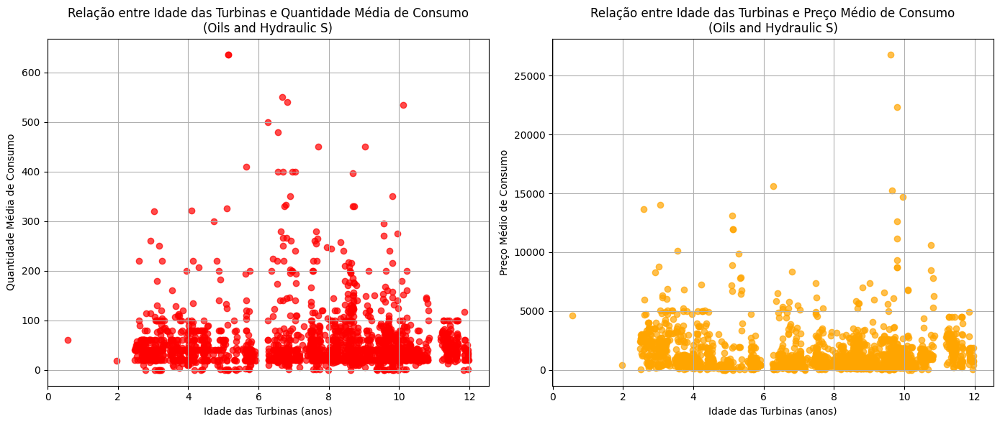

In [157]:
import pandas as pd
import matplotlib.pyplot as plt

# Carregar o arquivo csv
df = pd.read_csv('df_merge_sem966_BRL.csv')

# Filtrar o DataFrame para o grupo 'Oils and hydraulic s'
df_filtered = df[(df['DescGrupo'] == 'Oils and hydraulic s') & (df['Unidad medida base'] == 'L')]

# Calcular a quantidade média de consumo por aerogerador
mean_consumption = df_filtered.groupby('Aerogenerador')['Cantidad'].mean()

# Criar um DataFrame com a idade das turbinas e a quantidade média de consumo
turbine_age_mean_consumption = df[['Aerogenerador', 'TurbineAge']].drop_duplicates()
turbine_age_mean_consumption['QuantidadeMedia'] = turbine_age_mean_consumption['Aerogenerador'].map(mean_consumption)

# Calcular o preço médio de consumo por aerogerador
mean_price = df_filtered.groupby('Aerogenerador')['Importe ML...11'].mean()
turbine_age_mean_consumption['PrecoMedio'] = turbine_age_mean_consumption['Aerogenerador'].map(mean_price)

# Remover os 5 maiores valores de quantidade média e preço médio
turbine_age_mean_consumption = turbine_age_mean_consumption.drop(turbine_age_mean_consumption.nlargest(3, 'QuantidadeMedia').index)
turbine_age_mean_consumption = turbine_age_mean_consumption.drop(turbine_age_mean_consumption.nlargest(3, 'PrecoMedio').index)

# Plotar gráficos
plt.figure(figsize=(14, 6))

# Gráfico de dispersão para a quantidade média
plt.subplot(1, 2, 1)
plt.scatter(turbine_age_mean_consumption['TurbineAge'], turbine_age_mean_consumption['QuantidadeMedia'], alpha=0.7, color='red')
plt.title('Relação entre Idade das Turbinas e Quantidade Média de Consumo\n(Oils and Hydraulic S)')
plt.xlabel('Idade das Turbinas (anos)')
plt.ylabel('Quantidade Média de Consumo')
plt.grid(True)

# Gráfico de dispersão para o preço médio
plt.subplot(1, 2, 2)
plt.scatter(turbine_age_mean_consumption['TurbineAge'], turbine_age_mean_consumption['PrecoMedio'], alpha=0.7, color='orange')
plt.title('Relação entre Idade das Turbinas e Preço Médio de Consumo\n(Oils and Hydraulic S)')
plt.xlabel('Idade das Turbinas (anos)')
plt.ylabel('Preço Médio de Consumo')
plt.grid(True)

plt.tight_layout()
plt.show()


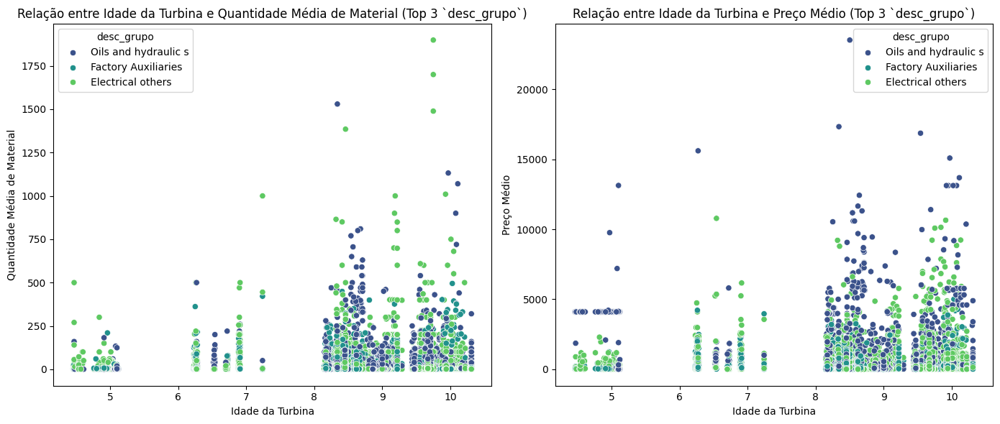

Unidades de medida para os 3 `desc_grupo` mais incidentes:
desc_grupo
Electrical others          [UN, KG]
Factory Auxiliaries       [UN, ROL]
Oils and hydraulic s    [L, UN, KG]
Name: unidade_medida, dtype: object


In [158]:
# precisa corrigir pra considerar a soma das quantidades e dos precos

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Carregar o arquivo csv
df = pd.read_csv('aerogeneradores_g9x_dados_completos.csv')

# Identificar as 3 `desc_grupo` mais incidentes
top_3_desc_grupos = df['desc_grupo'].value_counts().head(3).index

# Filtrar o DataFrame para essas 3 `desc_grupo`
df_top_3 = df[df['desc_grupo'].isin(top_3_desc_grupos)]

# Identificar os 5 maiores valores para quantidade média e preço médio
top_5_quantidade_media = df_top_3['quantidade_aerogenerador_material'].nlargest(5)
top_5_preco_medio = df_top_3['preco_aerogenerador_material'].nlargest(5)

# Excluir os casos com os 5 maiores valores em quantidade média e preço médio
df_filtered = df_top_3[
    ~df_top_3['quantidade_aerogenerador_material'].isin(top_5_quantidade_media) &
    ~df_top_3['preco_aerogenerador_material'].isin(top_5_preco_medio)
]

# Criar gráficos de dispersão para a relação entre idade da turbina e quantidade média/preço médio para as 3 `desc_grupo` mais incidentes
plt.figure(figsize=(14, 6))

# Gráfico de dispersão para a quantidade média
plt.subplot(1, 2, 1)
sns.scatterplot(x='idade_turbina', y='quantidade_aerogenerador_material', data=df_filtered, hue='desc_grupo', palette='viridis', legend='full')
plt.title('Relação entre Idade da Turbina e Quantidade Média de Material (Top 3 `desc_grupo`)')
plt.xlabel('Idade da Turbina')
plt.ylabel('Quantidade Média de Material')

# Gráfico de dispersão para o preço médio
plt.subplot(1, 2, 2)
sns.scatterplot(x='idade_turbina', y='preco_aerogenerador_material', data=df_filtered, hue='desc_grupo', palette='viridis', legend='full')
plt.title('Relação entre Idade da Turbina e Preço Médio (Top 3 `desc_grupo`)')
plt.xlabel('Idade da Turbina')
plt.ylabel('Preço Médio')

# Exibir gráficos
plt.tight_layout()
plt.show()

# Verificar se a unidade_medida é a mesma para os 3 `desc_grupo` mais incidentes
unidades_medida = df_top_3.groupby('desc_grupo')['unidade_medida'].unique()

# Exibir as unidades de medida
print("Unidades de medida para os 3 `desc_grupo` mais incidentes:")
print(unidades_medida)


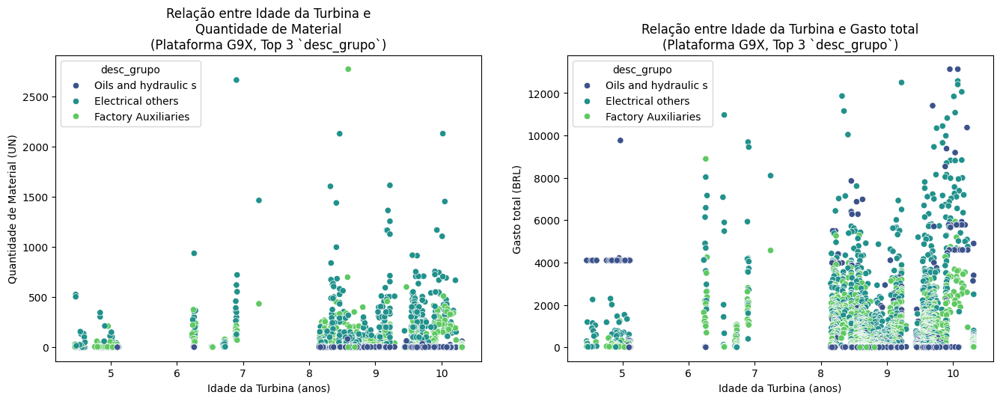

Moeda para os 3 `desc_grupo` mais incidentes:
desc_grupo
Electrical others       [BRL-BRL, DOP-BRL, MXN-BRL, UYU-BRL]
Factory Auxiliaries              [BRL-BRL, MXN-BRL, UYU-BRL]
Oils and hydraulic s    [BRL-BRL, DOP-BRL, MXN-BRL, UYU-BRL]
Name: moeda, dtype: object


In [130]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Carregar o arquivo csv
df = pd.read_csv('aerogeneradores_g9x_dados_completos.csv')

# Identificar as 3 `desc_grupo` mais incidentes
top_3_desc_grupos = df['desc_grupo'].value_counts().head(3).index

# Filtrar o DataFrame para essas 3 `desc_grupo`
df_top_3 = df[df['desc_grupo'].isin(top_3_desc_grupos)]

# Filtrar apenas os casos onde a unidade de medida é 'UN'
df_filtered_un = df_top_3[df_top_3['unidade_medida'] == 'UN']

# Agrupar por `Aerogenerador` e `desc_grupo` e somar as quantidades e preços
df_grouped = df_filtered_un.groupby(['aerogenerador', 'desc_grupo']).agg({
    'idade_turbina': 'first',  # Presume-se que a idade da turbina é a mesma para todas as linhas da mesma turbina
    'quantidade_aerogenerador_material': 'sum',
    'preco_aerogenerador_material': 'sum'
}).reset_index()

# Remover os 3 maiores valores de quantidade e preço
df_grouped = df_grouped.sort_values(by='quantidade_aerogenerador_material', ascending=False).iloc[3:]
df_grouped = df_grouped.sort_values(by='preco_aerogenerador_material', ascending=False).iloc[3:]

# Criar gráficos de dispersão para a relação entre idade da turbina e quantidade média/preço médio
plt.figure(figsize=(14, 6))

# Gráfico de dispersão para a quantidade média
plt.subplot(1, 2, 1)
sns.scatterplot(x='idade_turbina', y='quantidade_aerogenerador_material', data=df_grouped, hue='desc_grupo', palette='viridis', legend='full')
plt.title('Relação entre Idade da Turbina e\nQuantidade de Material\n(Plataforma G9X, Top 3 `desc_grupo`)')
plt.xlabel('Idade da Turbina (anos)')
plt.ylabel('Quantidade de Material (UN)')

# Gráfico de dispersão para o preço médio
plt.subplot(1, 2, 2)
sns.scatterplot(x='idade_turbina', y='preco_aerogenerador_material', data=df_grouped, hue='desc_grupo', palette='viridis', legend='full')
plt.title('Relação entre Idade da Turbina e Gasto total\n(Plataforma G9X, Top 3 `desc_grupo`)')
plt.xlabel('Idade da Turbina (anos)')
plt.ylabel('Gasto total (BRL)')

# Ajustar layout para evitar sobreposição dos títulos
plt.tight_layout(pad=3.0)  # Ajusta o espaçamento entre os gráficos e os títulos

# Exibir gráficos
plt.show()

# Verificar se a moeda é a mesma para os 3 `desc_grupo` mais incidentes
moeda = df_top_3.groupby('desc_grupo')['moeda'].unique()

# Exibir as unidades de medida
print("Moeda para os 3 `desc_grupo` mais incidentes:")
print(moeda)



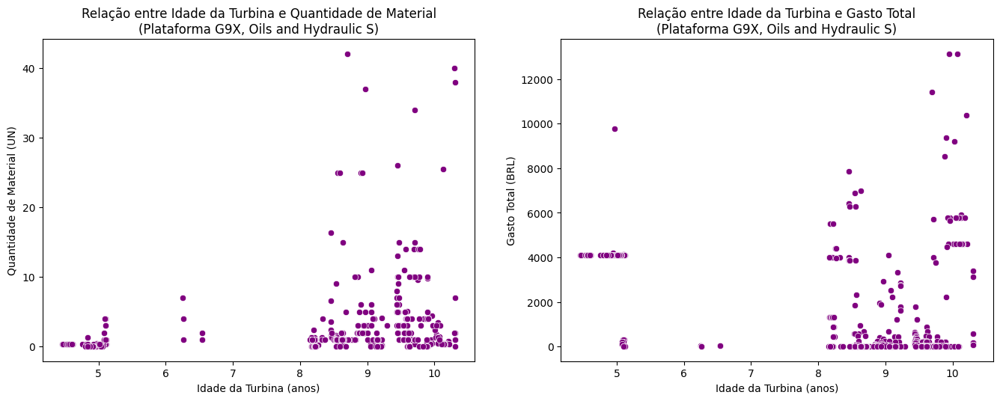

Moeda utilizada para 'Oils and hydraulic s': ['BRL-BRL' 'DOP-BRL' 'MXN-BRL' 'UYU-BRL']


In [135]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Carregar o arquivo csv
df = pd.read_csv('aerogeneradores_g9x_dados_completos.csv')

# Filtrar o DataFrame para o `desc_grupo` 'Oils and hydraulic s'
df_oils_hydraulics = df[df['desc_grupo'] == 'Oils and hydraulic s']

# Filtrar apenas os casos onde a unidade de medida é 'UN'
df_filtered_un = df_oils_hydraulics[df_oils_hydraulics['unidade_medida'] == 'UN']

# Agrupar por `Aerogenerador` e somar as quantidades e preços
df_grouped = df_filtered_un.groupby(['aerogenerador']).agg({
    'idade_turbina': 'first',  # Presume-se que a idade da turbina é a mesma para todas as linhas da mesma turbina
    'quantidade_aerogenerador_material': 'sum',
    'preco_aerogenerador_material': 'sum'
}).reset_index()

# Remover os 3 maiores valores de quantidade e preço
df_grouped = df_grouped.sort_values(by='quantidade_aerogenerador_material', ascending=False).iloc[3:]
df_grouped = df_grouped.sort_values(by='preco_aerogenerador_material', ascending=False).iloc[3:]

# Criar gráficos de dispersão para a relação entre idade da turbina e quantidade/preço
plt.figure(figsize=(14, 6))

# Gráfico de dispersão para a quantidade
plt.subplot(1, 2, 1)
sns.scatterplot(x='idade_turbina', y='quantidade_aerogenerador_material', data=df_grouped, color='purple')
plt.title('Relação entre Idade da Turbina e Quantidade de Material\n(Plataforma G9X, Oils and Hydraulic S)')
plt.xlabel('Idade da Turbina (anos)')
plt.ylabel('Quantidade de Material (UN)')

# Gráfico de dispersão para o preço
plt.subplot(1, 2, 2)
sns.scatterplot(x='idade_turbina', y='preco_aerogenerador_material', data=df_grouped, color='purple')
plt.title('Relação entre Idade da Turbina e Gasto Total\n(Plataforma G9X, Oils and Hydraulic S)')
plt.xlabel('Idade da Turbina (anos)')
plt.ylabel('Gasto Total (BRL)')

# Ajustar layout para evitar sobreposição dos títulos
plt.tight_layout(pad=3.0)  # Ajusta o espaçamento entre os gráficos e os títulos

# Exibir gráficos
plt.show()

# Verificar se a moeda é a mesma
moeda = df_oils_hydraulics['moeda'].unique()
print("Moeda utilizada para 'Oils and hydraulic s':", moeda)

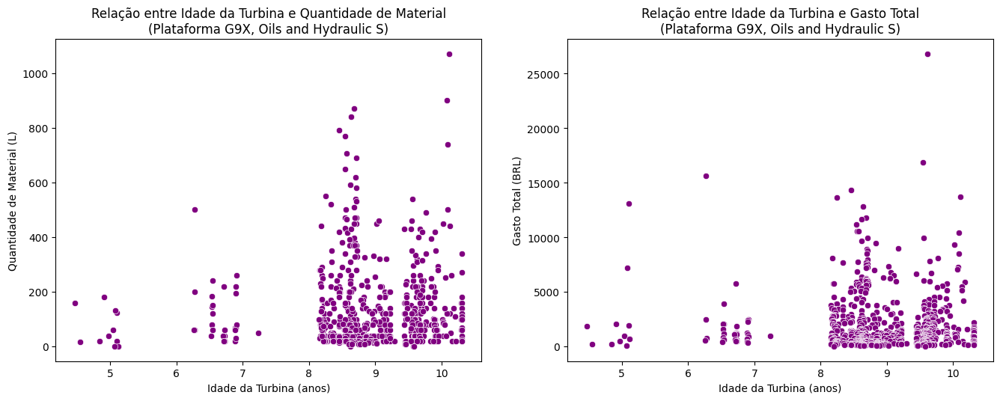

Moeda utilizada para 'Oils and hydraulic s': ['BRL-BRL' 'DOP-BRL' 'MXN-BRL' 'UYU-BRL']


In [136]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Carregar o arquivo csv
df = pd.read_csv('aerogeneradores_g9x_dados_completos.csv')

# Filtrar o DataFrame para o `desc_grupo` 'Oils and hydraulic s'
df_oils_hydraulics = df[df['desc_grupo'] == 'Oils and hydraulic s']

# Filtrar apenas os casos onde a unidade de medida é 'UN'
df_filtered_un = df_oils_hydraulics[df_oils_hydraulics['unidade_medida'] == 'L']

# Agrupar por `Aerogenerador` e somar as quantidades e preços
df_grouped = df_filtered_un.groupby(['aerogenerador']).agg({
    'idade_turbina': 'first',  # Presume-se que a idade da turbina é a mesma para todas as linhas da mesma turbina
    'quantidade_aerogenerador_material': 'sum',
    'preco_aerogenerador_material': 'sum'
}).reset_index()

# Remover os 3 maiores valores de quantidade e preço
df_grouped = df_grouped.sort_values(by='quantidade_aerogenerador_material', ascending=False).iloc[3:]
df_grouped = df_grouped.sort_values(by='preco_aerogenerador_material', ascending=False).iloc[3:]

# Criar gráficos de dispersão para a relação entre idade da turbina e quantidade/preço
plt.figure(figsize=(14, 6))

# Gráfico de dispersão para a quantidade
plt.subplot(1, 2, 1)
sns.scatterplot(x='idade_turbina', y='quantidade_aerogenerador_material', data=df_grouped, color='purple')
plt.title('Relação entre Idade da Turbina e Quantidade de Material\n(Plataforma G9X, Oils and Hydraulic S)')
plt.xlabel('Idade da Turbina (anos)')
plt.ylabel('Quantidade de Material (L)')

# Gráfico de dispersão para o preço
plt.subplot(1, 2, 2)
sns.scatterplot(x='idade_turbina', y='preco_aerogenerador_material', data=df_grouped, color='purple')
plt.title('Relação entre Idade da Turbina e Gasto Total\n(Plataforma G9X, Oils and Hydraulic S)')
plt.xlabel('Idade da Turbina (anos)')
plt.ylabel('Gasto Total (BRL)')

# Ajustar layout para evitar sobreposição dos títulos
plt.tight_layout(pad=3.0)  # Ajusta o espaçamento entre os gráficos e os títulos

# Exibir gráficos
plt.show()

# Verificar se a moeda é a mesma
moeda = df_oils_hydraulics['moeda'].unique()
print("Moeda utilizada para 'Oils and hydraulic s':", moeda)

C:\Users\natal\AppData\Local\Temp\ipykernel_26280\3607945098.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_oils_hydraulic['mtbf_aerogenerador_material_dias'] = pd.to_timedelta(df_oils_hydraulic['mtbf_aerogenerador_material'], errors='coerce').dt.days
C:\Users\natal\AppData\Local\Temp\ipykernel_26280\3607945098.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_oils_hydraulic_filtered['mtbf_intervalo'] = pd.cut(df_oils_hydraulic_filtered['mtbf_aerogenerador_material_dias'], bins=bins, labels=l

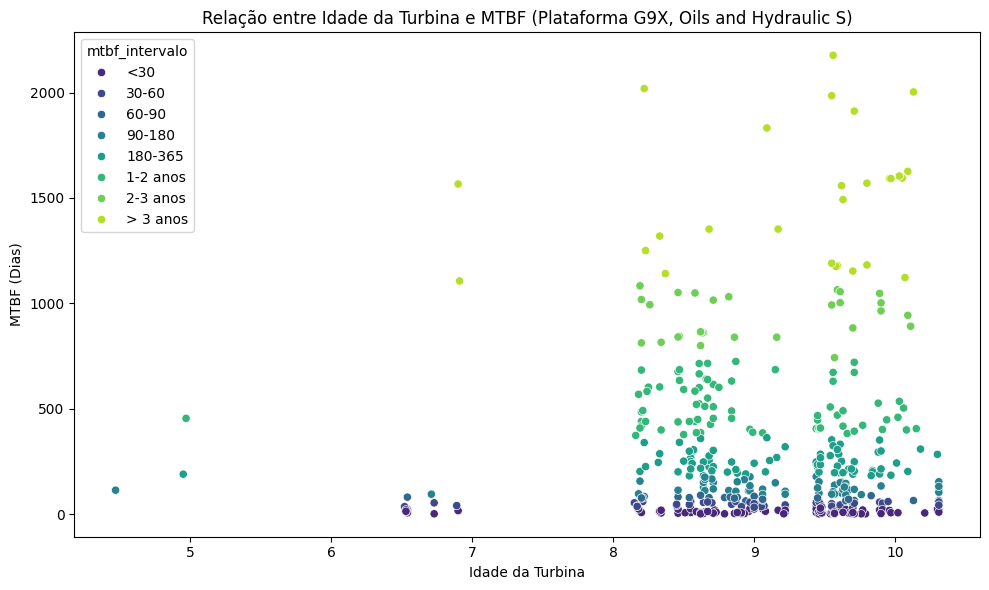

Média do MTBF para turbinas com idade entre 9,5 e 10,5 anos (incluindo valores 0): 119.77 dias
Média do MTBF para turbinas com idade entre 9,5 e 10,5 anos (excluindo valores 0): 400.57 dias


In [181]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Carregar o arquivo csv
df = pd.read_csv('aerogeneradores_g9x_dados_completos.csv')

# Filtrar o DataFrame para o grupo 'Oils and hydraulic s'
df_oils_hydraulic = df[df['desc_grupo'] == 'Oils and hydraulic s']

# Converter MTBF para dias
df_oils_hydraulic['mtbf_aerogenerador_material_dias'] = pd.to_timedelta(df_oils_hydraulic['mtbf_aerogenerador_material'], errors='coerce').dt.days

# Ignorar casos em que MTBF é zero ou nulo
df_oils_hydraulic_filtered = df_oils_hydraulic[df_oils_hydraulic['mtbf_aerogenerador_material_dias'] > 0]

# Criar intervalos para MTBF
bins = [0, 30, 60, 90, 180, 365, 730, 1095, float('inf')]
labels = ['<30', '30-60', '60-90', '90-180', '180-365', '1-2 anos', '2-3 anos', '> 3 anos']
df_oils_hydraulic_filtered['mtbf_intervalo'] = pd.cut(df_oils_hydraulic_filtered['mtbf_aerogenerador_material_dias'], bins=bins, labels=labels)

# Criar gráfico de dispersão para MTBF versus idade da turbina
plt.figure(figsize=(10, 6))
sns.scatterplot(x='idade_turbina', y='mtbf_aerogenerador_material_dias', data=df_oils_hydraulic_filtered, hue='mtbf_intervalo', palette='viridis', legend='full')
plt.title('Relação entre Idade da Turbina e MTBF (Plataforma G9X, Oils and Hydraulic S)')
plt.xlabel('Idade da Turbina')
plt.ylabel('MTBF (Dias)')

# Exibir gráfico
plt.tight_layout()
plt.show()

# Filtrar as turbinas com idade entre 9,5 e 10,5 anos
filtered_df = df_oils_hydraulic[(df_oils_hydraulic['idade_turbina'] >= 9.5) & (df_oils_hydraulic['idade_turbina'] <= 10.5)]

# Calcular a média de MTBF incluindo valores 0
media_mtbf_incl_zero = filtered_df['mtbf_aerogenerador_material_dias'].mean()

# Calcular a média de MTBF excluindo valores 0
filtered_df_non_zero = filtered_df[filtered_df['mtbf_aerogenerador_material_dias'] > 0]
media_mtbf_excl_zero = filtered_df_non_zero['mtbf_aerogenerador_material_dias'].mean()

print(f"Média do MTBF para turbinas com idade entre 9,5 e 10,5 anos (incluindo valores 0): {media_mtbf_incl_zero:.2f} dias")
print(f"Média do MTBF para turbinas com idade entre 9,5 e 10,5 anos (excluindo valores 0): {media_mtbf_excl_zero:.2f} dias")

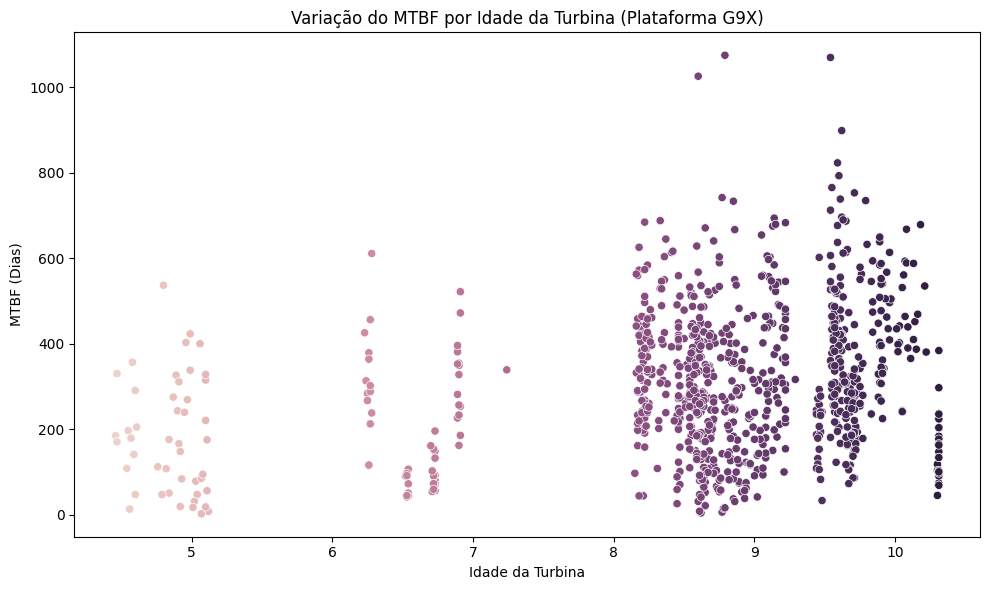

In [145]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Carregar o arquivo csv
df = pd.read_csv('aerogeneradores_g9x_dados_completos.csv')

# Converter MTBF para dias
df['mtbf_aerogenerador_material_dias'] = pd.to_timedelta(df['mtbf_aerogenerador_material'], errors='coerce').dt.days

# Ignorar casos em que MTBF é zero ou nulo
df_filtered = df[df['mtbf_aerogenerador_material_dias'] > 0]

# Calcular o MTBF médio para cada turbina
df_turbinas_mtbf = df_filtered.groupby(['aerogenerador', 'idade_turbina'])['mtbf_aerogenerador_material_dias'].mean().reset_index()

# Criar gráfico de dispersão para MTBF por idade da turbina
plt.figure(figsize=(10, 6))
sns.scatterplot(x='idade_turbina', y='mtbf_aerogenerador_material_dias', data=df_turbinas_mtbf, hue='idade_turbina', legend=None, marker='o')
plt.title('Variação do MTBF por Idade da Turbina (Plataforma G9X)')
plt.xlabel('Idade da Turbina')
plt.ylabel('MTBF (Dias)')

# Ajustar o layout e exibir gráfico
plt.tight_layout()
plt.show()


PARQUE PILOTO BR/1219

In [159]:
import pandas as pd

# Carregar o arquivo csv
df = pd.read_csv('df_merge_sem966_BRL.csv')

# Filtrar apenas as linhas com 'Parque' igual a 'BR/1219'
filtered_df = df[df['Parque'] == 'BR/1219']

# Obter a quantidade de aerogeradores únicos no parque BR/1219
num_aerogeneradores = filtered_df['Aerogenerador'].nunique()

# Criar uma lista para armazenar os resultados
result_list = []

# Iterar por cada aerogenerador único
for aerogenerador in filtered_df['Aerogenerador'].unique():
    # Filtrar as linhas para o aerogenerador atual
    aerogenerador_df = filtered_df[filtered_df['Aerogenerador'] == aerogenerador]
    
    # Calcular o MBTF para o aerogenerador
    datas_aerogenerador = pd.to_datetime(aerogenerador_df['Fecha de documento'])
    if len(datas_aerogenerador) > 1:
        datas_sorted_aerogenerador = datas_aerogenerador.sort_values()
        intervalos_aerogenerador = datas_sorted_aerogenerador.diff().dropna()
        mtbf_aerogenerador = intervalos_aerogenerador.mean()
    else:
        mtbf_aerogenerador = pd.Timedelta(0)

    # Inicializar o preço total gasto para o aerogenerador
    preco_aerogenerador = 0

    # Iterar por cada material único
    for material in aerogenerador_df['Material'].unique():
        # Filtrar as linhas para o material atual
        material_df = aerogenerador_df[aerogenerador_df['Material'] == material]
        
        # Calcular a quantidade média ignorando valores negativos de Cantidad
        quantidade_aerogenerador_material = material_df[material_df['Cantidad'] > 0]['Cantidad'].sum()
        
        # Calcular o preço médio ignorando valores negativos de Importe ML...11
        preco_aerogenerador_material = material_df[material_df['Importe ML...11'] > 0]['Importe ML...11'].sum()
        
        # Adicionar ao preço total gasto para o aerogenerador
        preco_aerogenerador += preco_aerogenerador_material
        
        # Obter a unidade de medida
        unidade_medida = material_df['Unidad medida base'].iloc[0] if not material_df['Unidad medida base'].empty else 'Desconhecida'
        
        # Obter a moeda
        moeda = material_df['Moneda...23'].iloc[0] if not material_df['Moneda...23'].empty else 'Desconhecida'
        
        # Obter o grupo de trabalho (DescGrupo)
        desc_grupo = material_df['DescGrupo'].iloc[0] if not material_df['DescGrupo'].empty else 'Desconhecido'
        
        # Obter a idade da turbina
        idade_turbina = aerogenerador_df['TurbineAge'].mean()
        
        # Recolher todas as datas para o material
        datas_material = pd.to_datetime(material_df['Fecha de documento'])
        
        # Calcular o MBTF para o aerogenerador e material
        if len(datas_material) > 1:
            datas_sorted_material = datas_material.sort_values()
            intervalos_material = datas_sorted_material.diff().dropna()
            mtbf_aerogenerador_material = intervalos_material.mean()
        else:
            mtbf_aerogenerador_material = pd.Timedelta(0)
        
        # Calcular o MBTF para o material em todos os aerogeradores
        material_global_df = filtered_df[filtered_df['Material'] == material]
        datas_material_global = pd.to_datetime(material_global_df['Fecha de documento'])
        if len(datas_material_global) > 1:
            datas_sorted_material_global = datas_material_global.sort_values()
            intervalos_material_global = datas_sorted_material_global.diff().dropna()
            mtbf_material = intervalos_material_global.mean()
        else:
            mtbf_material = pd.Timedelta(0)
        
        # Adicionar os resultados à lista
        result_list.append({
            'aerogenerador': aerogenerador,
            'material': material,
            'quantidade_aerogenerador_material': quantidade_aerogenerador_material,
            'unidade_medida': unidade_medida,
            'preco_aerogenerador_material': preco_aerogenerador_material,
            'moeda': moeda,
            'desc_grupo': desc_grupo,
            'idade_turbina': idade_turbina,
            'mtbf_aerogenerador_material': mtbf_aerogenerador_material,
            'mtbf_aerogenerador': mtbf_aerogenerador,
            'mtbf_material': mtbf_material
        })

# Criar um DataFrame a partir da lista de resultados
result_df = pd.DataFrame(result_list)

# Calcular quantidade_media_material e preco_medio_material
result_df['quantidade_media_material'] = result_df.groupby('material')['quantidade_aerogenerador_material'].transform('mean') / num_aerogeneradores
result_df['preco_medio_material'] = result_df.groupby('material')['preco_aerogenerador_material'].transform('mean') / num_aerogeneradores

# Calcular preco_aerogenerador (preço total gasto por aerogenerador independentemente do material)
result_df['preco_aerogenerador'] = result_df.groupby('aerogenerador')['preco_aerogenerador_material'].transform('sum')

# Salvar o DataFrame resultante em um novo arquivo CSV
result_df.to_csv('aerogeneradores_br1219_dados_completos.csv', index=False)

print("DataFrame resultante criado e salvo como 'aerogeneradores_br1219_dados_completos.csv'.")


C:\Users\natal\AppData\Local\Temp\ipykernel_26280\431138871.py:4: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('df_merge_sem966_BRL.csv')


DataFrame resultante criado e salvo como 'aerogeneradores_br1219_dados_completos.csv'.


Número de aerogeneradores únicos: 36
    mtbf_aerogenerador_material  mtbf_aerogenerador_material_dias
3               0 days 00:00:00                                 0
127             0 days 00:00:00                                 0
135             0 days 00:00:00                                 0
162             0 days 00:00:00                                 0
264             0 days 00:00:00                                 0


C:\Users\natal\AppData\Local\Temp\ipykernel_26280\577154171.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_oils_hydraulic['mtbf_aerogenerador_material_dias'] = pd.to_timedelta(df_oils_hydraulic['mtbf_aerogenerador_material'], errors='coerce').dt.days
C:\Users\natal\AppData\Local\Temp\ipykernel_26280\577154171.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_oils_hydraulic['mtbf_intervalo'] = pd.cut(df_oils_hydraulic['mtbf_aerogenerador_material_dias'], bins=bins, labels=labels, right=False)


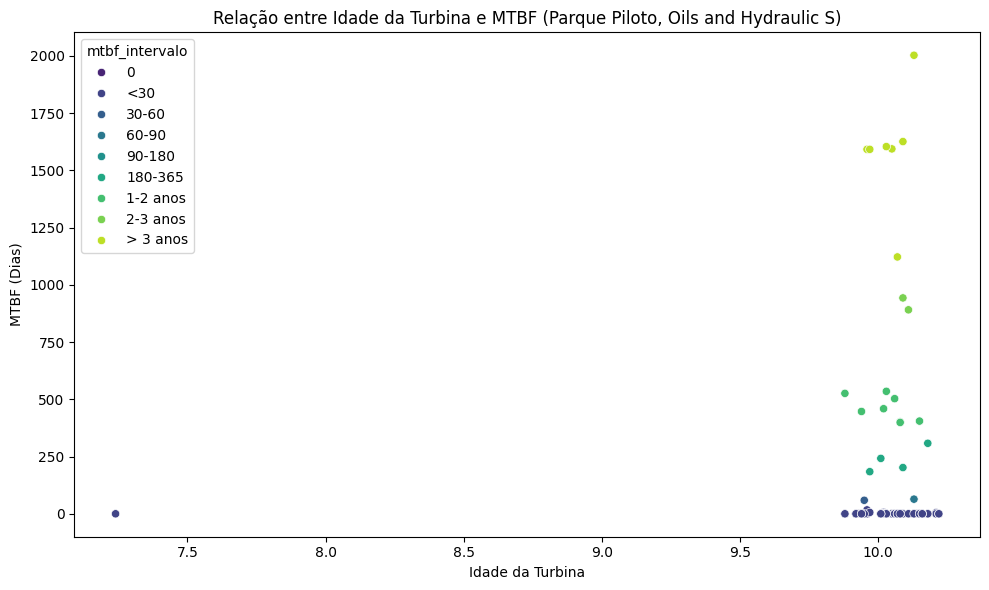

Média do MTBF para turbinas com idade entre 9,5 e 10,5 anos (incluindo valores 0): 182.84 dias
Média do MTBF para turbinas com idade entre 9,5 e 10,5 anos (excluindo valores 0): 656.85 dias


In [180]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Carregar o arquivo csv
df = pd.read_csv('aerogeneradores_br1219_dados_completos.csv')

# Contar o número de aerogeradores únicos
num_aerogeneradores_unicos = df['aerogenerador'].nunique()
print(f"Número de aerogeneradores únicos: {num_aerogeneradores_unicos}")

# Filtrar o DataFrame para o grupo 'Oils and hydraulic s'
df_oils_hydraulic = df[df['desc_grupo'] == 'Oils and hydraulic s']

# Converter MTBF para dias, substituindo erros por NaN
df_oils_hydraulic['mtbf_aerogenerador_material_dias'] = pd.to_timedelta(df_oils_hydraulic['mtbf_aerogenerador_material'], errors='coerce').dt.days

# Verificar se há valores nulos ou não convertíveis em 'mtbf_aerogenerador_material_dias'
print(df_oils_hydraulic[['mtbf_aerogenerador_material', 'mtbf_aerogenerador_material_dias']].head())

# Criar intervalos para MTBF, incluindo zero
bins = [-1, 0, 30, 60, 90, 180, 365, 730, 1095, float('inf')]
labels = ['0', '<30', '30-60', '60-90', '90-180', '180-365', '1-2 anos', '2-3 anos', '> 3 anos']
df_oils_hydraulic['mtbf_intervalo'] = pd.cut(df_oils_hydraulic['mtbf_aerogenerador_material_dias'], bins=bins, labels=labels, right=False)

# Criar gráfico de dispersão para MTBF versus idade da turbina
plt.figure(figsize=(10, 6))
sns.scatterplot(x='idade_turbina', y='mtbf_aerogenerador_material_dias', data=df_oils_hydraulic, hue='mtbf_intervalo', palette='viridis', legend='full')
plt.title('Relação entre Idade da Turbina e MTBF (Parque Piloto, Oils and Hydraulic S)')
plt.xlabel('Idade da Turbina')
plt.ylabel('MTBF (Dias)')

# Exibir gráfico
plt.tight_layout()
plt.show()

# Filtrar as turbinas com idade entre 9,5 e 10,5 anos
filtered_df = df_oils_hydraulic[(df_oils_hydraulic['idade_turbina'] >= 9.5) & (df_oils_hydraulic['idade_turbina'] <= 10.5)]

# Calcular a média de MTBF incluindo valores 0
media_mtbf_incl_zero = filtered_df['mtbf_aerogenerador_material_dias'].mean()

# Calcular a média de MTBF excluindo valores 0
filtered_df_non_zero = filtered_df[filtered_df['mtbf_aerogenerador_material_dias'] > 0]
media_mtbf_excl_zero = filtered_df_non_zero['mtbf_aerogenerador_material_dias'].mean()

print(f"Média do MTBF para turbinas com idade entre 9,5 e 10,5 anos (incluindo valores 0): {media_mtbf_incl_zero:.2f} dias")
print(f"Média do MTBF para turbinas com idade entre 9,5 e 10,5 anos (excluindo valores 0): {media_mtbf_excl_zero:.2f} dias")

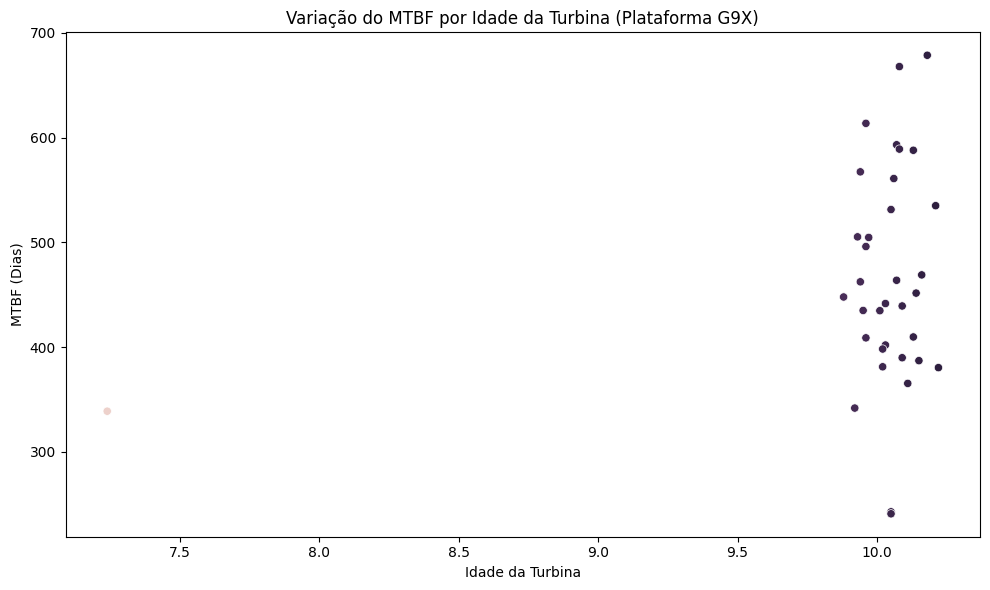

In [177]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Carregar o arquivo csv
df = pd.read_csv('aerogeneradores_br1219_dados_completos.csv')

# Converter MTBF para dias
df['mtbf_aerogenerador_material_dias'] = pd.to_timedelta(df['mtbf_aerogenerador_material'], errors='coerce').dt.days

# Ignorar casos em que MTBF é zero ou nulo
df_filtered = df[df['mtbf_aerogenerador_material_dias'] > 0]

# Calcular o MTBF médio para cada turbina
df_turbinas_mtbf = df_filtered.groupby(['aerogenerador', 'idade_turbina'])['mtbf_aerogenerador_material_dias'].mean().reset_index()

# Criar gráfico de dispersão para MTBF por idade da turbina
plt.figure(figsize=(10, 6))
sns.scatterplot(x='idade_turbina', y='mtbf_aerogenerador_material_dias', data=df_turbinas_mtbf, hue='idade_turbina', legend=None, marker='o')
plt.title('Variação do MTBF por Idade da Turbina (Plataforma G9X)')
plt.xlabel('Idade da Turbina')
plt.ylabel('MTBF (Dias)')

# Ajustar o layout e exibir gráfico
plt.tight_layout()
plt.show()


In [176]:
# Obter as idades únicas das turbinas
id_uniq = df[['aerogenerador', 'idade_turbina']].drop_duplicates()

# Exibir as idades de cada turbina única
for aerogenerador, idade in id_uniq.values:
    print(f"Aerogenerador: {aerogenerador}, Idade: {idade}")

Aerogenerador: WF-BR-0PI-1219-Y1-A-001, Idade: 10.049999999999995
Aerogenerador: WF-BR-0PI-1219-Y1-A-002, Idade: 10.049999999999995
Aerogenerador: WF-BR-0PI-1219-Y1-A-003, Idade: 10.05
Aerogenerador: WF-BR-0PI-1219-Y1-A-004, Idade: 9.960000000000004
Aerogenerador: WF-BR-0PI-1219-Y1-A-005, Idade: 9.960000000000004
Aerogenerador: WF-BR-0PI-1219-Y1-A-006, Idade: 10.03
Aerogenerador: WF-BR-0PI-1219-Y1-A-007, Idade: 9.960000000000004
Aerogenerador: WF-BR-0PI-1219-Y1-A-008, Idade: 9.97
Aerogenerador: WF-BR-0PI-1219-Y2-A-001, Idade: 10.090000000000003
Aerogenerador: WF-BR-0PI-1219-Y2-A-002, Idade: 10.090000000000002
Aerogenerador: WF-BR-0PI-1219-Y2-A-003, Idade: 10.08
Aerogenerador: WF-BR-0PI-1219-Y2-A-004, Idade: 10.06
Aerogenerador: WF-BR-0PI-1219-Y2-A-005, Idade: 10.069999999999997
Aerogenerador: WF-BR-0PI-1219-Y2-A-006, Idade: 10.07
Aerogenerador: WF-BR-0PI-1219-Y2-A-007, Idade: 10.080000000000002
Aerogenerador: WF-BR-0PI-1219-Y3-A-001, Idade: 10.140000000000002
Aerogenerador: WF-BR-0PI-1

In [169]:
print(df_oils_hydraulic[['idade_turbina', 'mtbf_aerogenerador_material_dias']].isnull().sum())


idade_turbina                       0
mtbf_aerogenerador_material_dias    0
dtype: int64


In [172]:
print(df_oils_hydraulic['aerogenerador'].nunique())



35


In [173]:
print(df_oils_hydraulic[['mtbf_aerogenerador_material_dias', 'mtbf_intervalo']].head())


     mtbf_aerogenerador_material_dias mtbf_intervalo
3                                   0            NaN
127                                 0            NaN
135                                 0            NaN
162                                 0            NaN
264                                 0            NaN
